In [1]:
import torch

# Loading the model and moving it to the GPU if available
if torch.cuda.is_available():  # for nvidia GPUs etc.
    device = torch.device('cuda')
elif torch.backends.mps.is_available(): # for Apple Metal Performance Sharder (mps) GPUs
    device = torch.device('mps')
else:
    device = torch.device('cpu')

print(device)

# Load the fine-tuned model (after training)

from transformers import AutoModelForMaskedLM, AutoConfig, DistilBertTokenizerFast

# Load model
dir_model = "./model-elsevier (lr 5e-5)"
tokenizer = DistilBertTokenizerFast.from_pretrained('distilbert-base-uncased')
config = AutoConfig.from_pretrained(dir_model, output_hidden_states=True)
model_elsevier = AutoModelForMaskedLM.from_pretrained(dir_model, config=config).to(device)

mps


In [2]:
import numpy as np
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()


def get_embeddings(vocab, model, batch_size=100):
    tokenized_words = tokenizer(vocab, return_tensors="pt",
                                padding=True, truncation=True).to(device)

    # Split tokenized words into batches
    token_batches = [{'input_ids': tokenized_words["input_ids"][i:i + batch_size],
                      'attention_mask': tokenized_words["attention_mask"][i:i + 100]} for i in range(0, len(tokenized_words["input_ids"]), batch_size)]
    
    # Initialize an empty list to store the embeddings
    all_word_embeddings = []

    # Process each batch
    for batch_tokens in tqdm(token_batches):

        # Forward pass to get embeddings for the current batch
        with torch.no_grad():
            outputs = model(input_ids=batch_tokens["input_ids"],
                            attention_mask=batch_tokens["attention_mask"])

        # Obtain embeddings for the current batch
        batch_embeddings = outputs.hidden_states[0].cpu().numpy()

        # Append to the list
        all_word_embeddings.append(batch_embeddings)

    # Concatenate the embeddings from all batches
    all_word_embeddings_concat = np.concatenate(all_word_embeddings, axis=0)

    # Take the mean of embeddings for each word
    all_word_embeddings_concat = np.mean(all_word_embeddings_concat, axis=1)
    
    return scaler.fit_transform(all_word_embeddings_concat)

# Get the vocabulary
unique_tokens_elsevier = list(tokenizer.get_vocab())


all_word_embeddings_elsevier = get_embeddings(unique_tokens_elsevier,
                                              model_elsevier)
print(all_word_embeddings_elsevier.shape)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


100%|█████████████████████████████████████████| 306/306 [00:22<00:00, 13.62it/s]


(30522, 768)


In [3]:
# Load reddit model
dir_model = "./model-redit(lr 5e-5)"
tokenizer = DistilBertTokenizerFast.from_pretrained('distilbert-base-uncased')
config = AutoConfig.from_pretrained(dir_model, output_hidden_states=True)
model_reddit = AutoModelForMaskedLM.from_pretrained(dir_model, config=config).to(device)

# Get the vocabulary
unique_tokens_reddit = list(tokenizer.get_vocab())

all_word_embeddings_reddit = get_embeddings(unique_tokens_reddit,
                                            model_reddit)
print(all_word_embeddings_reddit.shape)

100%|█████████████████████████████████████████| 306/306 [00:22<00:00, 13.69it/s]


(30522, 768)


In [4]:
# Read the file and extract words and vectors
with open('vectors.txt', 'r', encoding='utf-8') as file:
    lines = file.readlines()

# Get glove vector from file txt
glove_vectors = {}

for line in tqdm(lines):
    parts = line.split()
    word = parts[0]
    vector = np.array([float(x) for x in parts[1:]])
    glove_vectors[word] = vector

# Extract vectors
unique_tokens_glove = list(glove_vectors.keys())

# Convert the list of vectors to a NumPy array and normalize
all_word_embeddings_glove = np.array(list(glove_vectors.values()))

print(all_word_embeddings_glove.shape)

100%|████████████████████████████████| 100001/100001 [00:07<00:00, 13414.47it/s]


(100001, 768)


In [1]:
import pandas as pd
import numpy as np

# Load co-occurrence matrix from csv file
co_occurrence_df = pd.read_csv('final_cooccurrence.csv', header=None)

co_occurrence_df

,0,1,2
0,3245,22361,-18.747865
1,35367,38165,-19.454503
2,10915,96695,-20.500552
3,8474,92967,-20.931273
4,5942,17414,-21.910292
...,...,...,...
98507355,9002,14613,-25.181616
98507356,5403,37135,-22.828965
98507357,603,73812,-27.054791
98507358,3518,17824,-21.740074


In [47]:
all_ID

array([    6,    11,    15, ..., 99991, 99998, 99999])

In [26]:
# Load vocabulary from csv file
vocab_SVD = pd.read_csv('vocab_info.csv', header=None)

vocab_SVD

,0,1
0,_noun_,559117527460
1,_verb_,253840440111
2,_adp_,217900370475
3,_det_,187937151050
4,_adj_,133271938154
...,...,...
1048570,bkf_noun,13045
1048571,cawkell,13045
1048572,csuf,13045
1048573,blers_noun,13045


In [27]:
from scipy.sparse import csr_matrix

vocab_SVD = vocab_SVD.loc[:99999, ]

# Get unique words and create a mapping to index
all_ID = np.unique(np.concatenate([co_occurrence_df[0].values, co_occurrence_df[1].values]))
ID_to_index = {word: index for index, word in enumerate(all_ID)}
word_to_ID = {word: index for index, word in enumerate(vocab_SVD[0])}


# Create a sparse matrix
co_occurrence_coo = csr_matrix((co_occurrence_df[2].values, (co_occurrence_df[0].map(ID_to_index), co_occurrence_df[1].map(ID_to_index))))

In [4]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(n_components=768, random_state=23)
embeddings_svd = svd.fit_transform(co_occurrence_coo)
embeddings_svd.shape

(46994, 768)

In [44]:
target="men"
ID_word = word_to_ID[target]
ID_word

363

In [45]:
index_word = ID_to_index[ID_word]
print(index_word)
embeddings_svd[index_word]

KeyError: 363

In [24]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Perform t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d_SVD = tsne.fit_transform(embeddings)

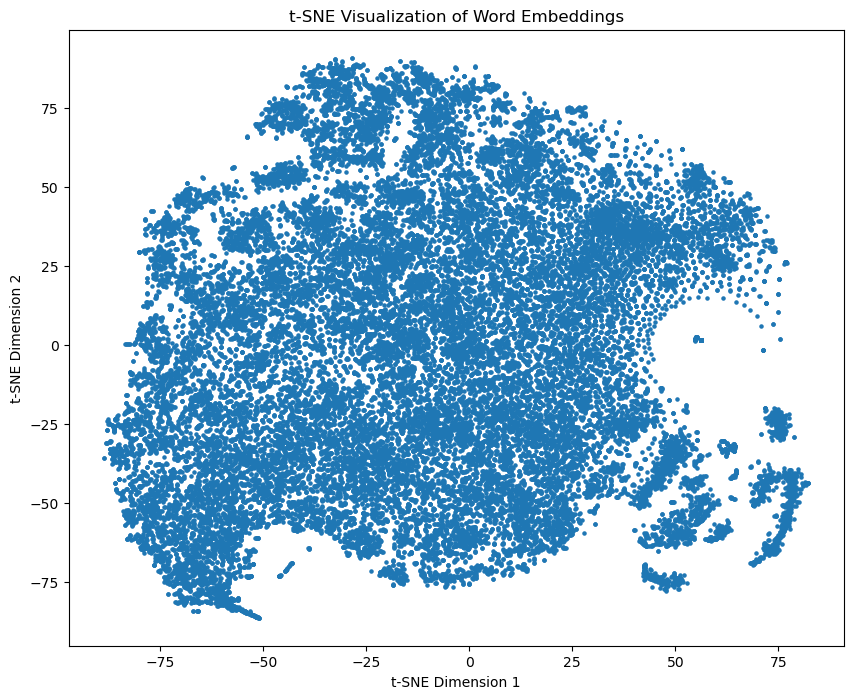

In [25]:
# Plot the 2D embeddings
plt.figure(figsize=(10, 8))
plt.scatter(embeddings_2d_SVD[:, 0], embeddings_2d_SVD[:, 1], s=5)
plt.title('t-SNE Visualization of Word Embeddings')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

In [7]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Perform t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d_elsevier = tsne.fit_transform(all_word_embeddings_elsevier)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


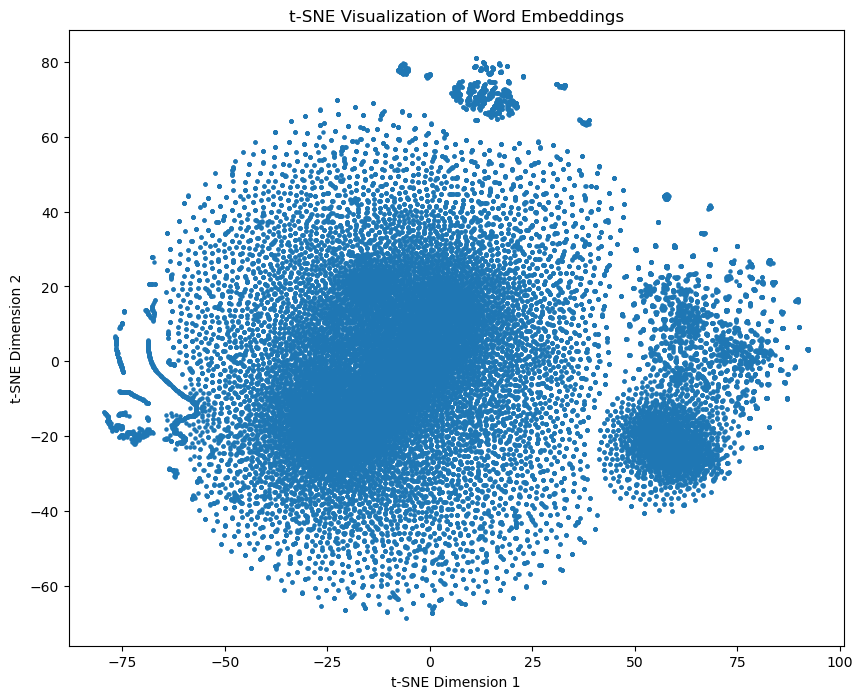

In [8]:
# Plot the 2D embeddings
plt.figure(figsize=(10, 8))
plt.scatter(embeddings_2d_elsevier[:, 0], embeddings_2d_elsevier[:, 1], s=5)
plt.title('t-SNE Visualization of Word Embeddings')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

In [9]:
# Perform same 2d plot to compare
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d_reddit = tsne.fit_transform(all_word_embeddings_reddit)

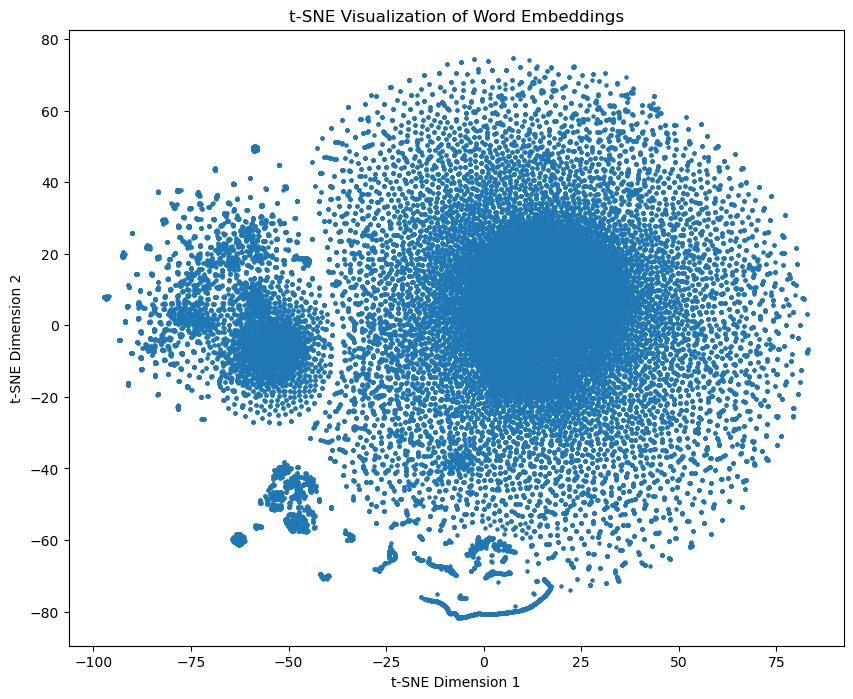

In [10]:
# Plot the 2D embeddings
plt.figure(figsize=(10, 8))
plt.scatter(embeddings_2d_reddit[:, 0], embeddings_2d_reddit[:, 1], s=5)
plt.title('t-SNE Visualization of Word Embeddings')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

In [11]:
# Perform same 2d plot to compare
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d_glove = tsne.fit_transform(all_word_embeddings_glove)

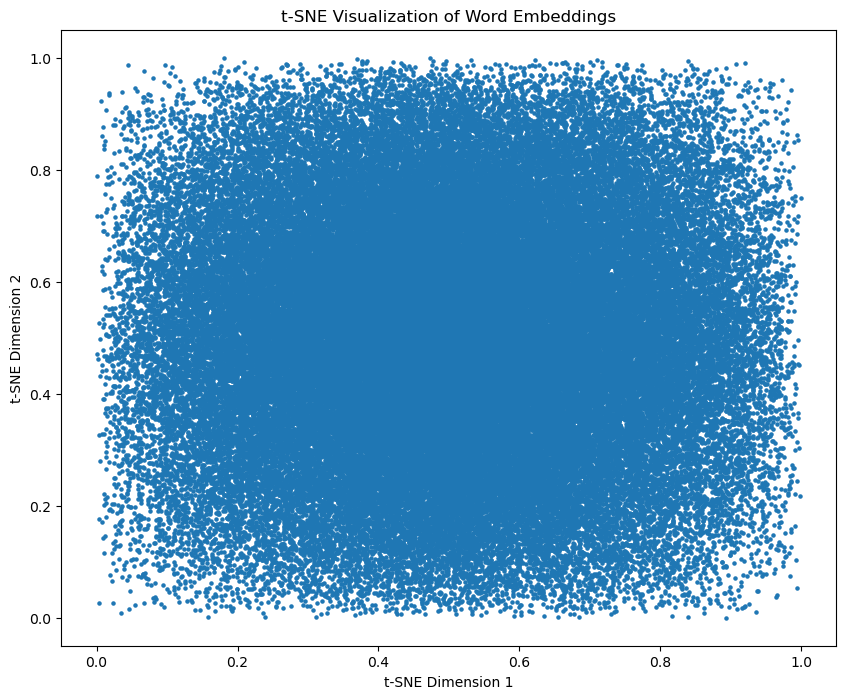

In [12]:
# Plot the 2D embeddings
plt.figure(figsize=(10, 8))
plt.scatter(all_word_embeddings_glove[:, 0], all_word_embeddings_glove[:, 1], s=5)
plt.title('t-SNE Visualization of Word Embeddings')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

Lets load a dataset with categorioes in order to get more information from plots and later evaluate the different embeddings we obtained.

In [5]:
import pandas as pd


categories_df = pd.read_csv('https://raw.githubusercontent.com/vecto-ai/word-benchmarks/master/word-categorization/monolingual/en/ap.csv',
                            index_col=0)

categories = {}
for category in set(categories_df["category"]):
    categories[category] = categories_df.loc[categories_df["category"] == category, "word"].dropna().values

categories["animal"]

array(['bear', 'bull', 'camel', 'cat', 'cow', 'deer', 'dog', 'elephant',
       'horse', 'kitten', 'lion', 'monkey', 'mouse', 'oyster', 'puppy',
       'rat', 'sheep', 'tiger', 'turtle', 'zebra'], dtype=object)

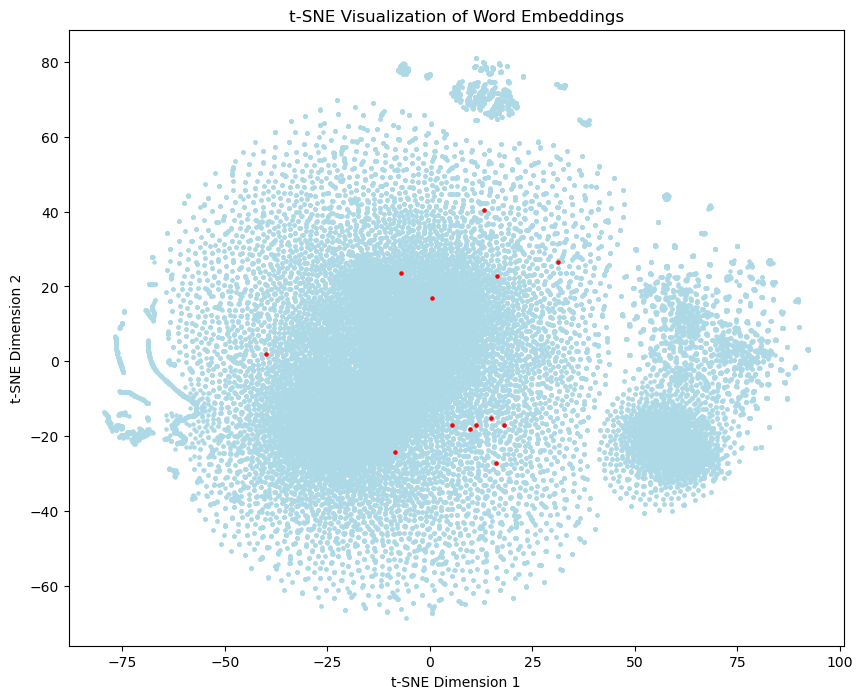

In [14]:
# Plot the embeddings with a category in red

category = "feeling"

plt.figure(figsize=(10, 8))
scatter = plt.scatter(embeddings_2d_elsevier[:, 0], embeddings_2d_elsevier[:, 1], s=5, c='lightblue')  # s is the marker size

for word, (x, y) in zip(unique_tokens_elsevier, embeddings_2d_elsevier):
    if word in categories[category]:
        index = unique_tokens_elsevier.index(word)
        scatter = plt.scatter(x, y, s=5, c='red', label=word)
    
plt.title('t-SNE Visualization of Word Embeddings')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

In [ ]:
# Plot the embeddings with a category in red

category = "feeling"

plt.figure(figsize=(10, 8))
scatter = plt.scatter(embeddings_2d_glove[:, 0], embeddings_2d_glove[:, 1], s=5, c='lightblue')

for word, (x, y) in zip(unique_tokens_glove, embeddings_2d_glove):
    if word in categories[category]:
        index = unique_tokens_glove.index(word)
        scatter = plt.scatter(x, y, s=5, c='red', label=word)
    
plt.title('t-SNE Visualization of Word Embeddings')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

In [16]:
# Perform t-SNE with 3 dimensions
tsne = TSNE(n_components=3, random_state=42)
embeddings_3d_elsevier = tsne.fit_transform(all_word_embeddings_elsevier)

In [17]:
import plotly.express as px

fig = px.scatter_3d(x=embeddings_3d_elsevier[:, 0],
                    y=embeddings_3d_elsevier[:, 1],
                    z=embeddings_3d_elsevier[:, 2])
fig.update_traces(marker_size = 2)
fig.show()

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


As you can see in the previous plot, there is a huge accumulation and some outliers. The outliers are making it difficult to visualize the accumulation, so lets remove them.

In [18]:
import numpy as np
from scipy.stats import zscore

# Calculate z-scores for each dimension
z_scores = zscore(embeddings_3d_elsevier, axis=0)

# Set a threshold for z-scores to identify outliers (adjust as needed)
threshold = 2.5

# Identify indices of non-outliers
non_outlier_indices = np.all(np.abs(z_scores) < threshold, axis=1)

# Filter data to exclude outliers
filtered_embeddings = embeddings_3d_elsevier[non_outlier_indices]

fig = px.scatter_3d(x=filtered_embeddings[:, 0],
                    y=filtered_embeddings[:, 1],
                    z=filtered_embeddings[:, 2])

fig.update_traces(marker_size = 2)
fig.show()

In [19]:
# Plot in red a category

import plotly.graph_objects as go

category = "feeling"

fig = px.scatter_3d(x=filtered_embeddings[:, 0],
                    y=filtered_embeddings[:, 1],
                    z=filtered_embeddings[:, 2],
                    opacity=0.5)

# Change the color of specific words
for word, (x, y, z) in zip(unique_tokens_elsevier, embeddings_3d_elsevier):
    if word in categories[category]:
        fig.add_trace(
            go.Scatter3d(x=[x],
                         y=[y],
                         z=[z],
                         mode="markers",
                         marker=dict(
                             size=12,
                             color="red")))
        
fig.update_traces(marker_size = 2)
fig.update_layout(showlegend=False)
fig.show()

In this 3d representation, the categories are more grouped together.

In order to evaluate the embeddings, lets create a function to get the first n words given an analogy. For example, if woman-men, queen-?, which n words will be fit the analogy. In other words, if we calculate the distance between woman and meen in the vector representation and we move this distance from queen, we should get king.

In [54]:
def get_word(index):
    ref_word = cooccurrence_to_index.keys()[index]
    word = word_to_index.keys()[ref_word]
    
    return word

In [45]:
def get_embeddings_word(word, vocab, embeddings, method="transformer"):
    if method == "glove":
        return glove_vectors[word]
    
    if method == "svd":
        word_i = word_to_index[word]
        return embeddings[cooccurrence_to_index[word_i], :]
    
    return embeddings[vocab.index(word)]

In [55]:
from sklearn.metrics.pairwise import cosine_similarity

def get_analogy(w1, w2, w3, vocab, embeddings, n, method="transformer"):
    embedding_w1 = get_embeddings_word(w1, vocab, embeddings, method=method)
    
    embedding_w2 = get_embeddings_word(w2, vocab, embeddings, method=method)
    
    embedding_w3 = get_embeddings_word(w3, vocab, embeddings, method=method)

    analogy_vector = embedding_w1 - embedding_w2

    embedding_result = embedding_w3 + analogy_vector

    # Compute cosine similarity between embedding_king_prime and all other word embeddings
    similarities = cosine_similarity([embedding_result], embeddings)
    
    # Get the indices of the top X most similar words
    top_indices = similarities.argsort()[0][-1-n:][::-1]
    
    
    if method == "svd":
        return [get_word(index) for i in top_indices]
        
    

    # Retrieve the top X words
    return [vocab[i] for i in top_indices if vocab[i] != w3]

get_analogy("woman", "man", "king", unique_tokens_elsevier, all_word_embeddings_elsevier, 3)

NameError: name 'unique_tokens_elsevier' is not defined

In [50]:
get_analogy("woman", "man", "king",
            unique_tokens_glove, all_word_embeddings_glove, n=5, method="glove")

NameError: name 'unique_tokens_glove' is not defined

In [57]:
get_analogy("woman", "man", "king",
            word_embeddings, word_embeddings,
            n=5, method="svd")

KeyError: 1303

Lets load a analogies dataset and evaluate our embeddings

In [43]:
import pandas as pd
analogy_df = pd.read_csv('https://raw.githubusercontent.com/vecto-ai/word-benchmarks/master/word-analogy/monolingual/en/google-analogies.csv',
                        index_col=0)

def eval_analogies(vocab, embeddings, x=len(analogy_df), glove=False):
    punct = 0
    if glove:
        def fun_get_analogy(w1, w2, w3, vocab, embeddings, n):
            return get_analogy_glove(w1, w2, w3, n)
    else:
        def fun_get_analogy(w1, w2, w3, vocab, embeddings, n):
            return get_analogy(w1, w2, w3, vocab, embeddings, n)
        
    for i in tqdm(range(len(analogy_df[:x]))):
        if all([word.lower() in vocab for word in analogy_df.loc[i, ["word1", "word2", "word3", "target"]].values]):
            target = analogy_df.loc[i, "target"].lower()
        
            similar_words = fun_get_analogy(analogy_df.loc[i, "word1"].lower(),
                                        analogy_df.loc[i, "word2"].lower(),
                                        analogy_df.loc[i, "word3"].lower(),
                                        vocab,
                                        embeddings, 5)
            similar_words.reverse()

            if target in similar_words:
                punct = punct + similar_words.index(target) + 1
            
    return punct

In [38]:
analogies_elsevier = eval_analogies(unique_tokens_elsevier, all_word_embeddings_elsevier)
analogies_elsevier

100%|█████████████████████████████████████| 19544/19544 [07:59<00:00, 40.74it/s]


19267

In [28]:
analogies_reddit = eval_analogies(unique_tokens_reddit, all_word_embeddings_reddit)
analogies_reddit

100%|█████████████████████████████████████| 19544/19544 [08:04<00:00, 40.33it/s]


16258

In [9]:
get_analogy("man", "king", "woman", unique_tokens_glove, all_word_embeddings_glove, 5)

['man', 'nonpolar', 'reproducibility', 'okla', 'accumulator_noun']

In [44]:
analogies_glove = eval_analogies(unique_tokens_glove, all_word_embeddings_glove,
                                 x=1000, glove=True)
analogies_glove

100%|███████████████████████████████████████| 1000/1000 [02:36<00:00,  6.38it/s]


0

In [37]:
from sklearn.metrics.pairwise import cosine_similarity

def predict_category(word, vocab, embeddings, threshold=0.7):
    
    # Compute category centroids
    category_centroids = {
        category: get_category_centroids(words, vocab, embeddings)
        for category, words in categories.items()
    }
    
    max_similarity = 0
    
    if word in vocab:
        word_embedding = get_embeddings_word(word, vocab, embeddings)
        
        max_category = {}
        for category in category_centroids:
            similarities = cosine_similarity([word_embedding], category_centroids[category])
            max_category[category] = similarities.max()

        max_similarity = max(max_category.values())
    
    if max_similarity > threshold:
        predicted_category = max(max_category, key=max_category.get)
        return predicted_category
    else:
        return "Uncategorized"

def get_category_centroids(words, vocab, embeddings):
    category_embedding = []
    for word in words:
        if word in vocab:
            category_embedding.append(get_embeddings_word(word, vocab, embeddings))
    return np.vstack(category_embedding)
            


# Usage:
word_to_predict = "elephant"
predicted_category = predict_category(word_to_predict, unique_tokens_elsevier, all_word_embeddings_elsevier)
print(f"The predicted category for '{word_to_predict}' is '{predicted_category}'.")

The predicted category for 'elephant' is 'animal'.


In [38]:
def eval_categories(vocab, embeddings):
    punct = 0
    
    for i in tqdm(range(len(categories_df))):
        
        if categories_df.loc[i, "category"] != float("nan") or categories_df.loc[i, "word"] != float("nan"):
            observed_category = categories_df.loc[i, "category"].lower()


            predicted_category = predict_category(categories_df.loc[i, "word"],
                                                  vocab,
                                                  embeddings)

            if observed_category == predicted_category:
                punct = punct + 1
    return punct

categories_elsevier = eval_categories(unique_tokens_elsevier, all_word_embeddings_elsevier)
categories_elsevier

100%|█████████████████████████████████████████| 423/423 [01:05<00:00,  6.51it/s]


285

In [39]:
categories_reddit = eval_categories(unique_tokens_reddit, all_word_embeddings_reddit)
categories_reddit

100%|█████████████████████████████████████████| 423/423 [01:05<00:00,  6.45it/s]


285

In [40]:
vector_reddit = embedding_reddit_loss.reshape(1, -1)
vector_elsevier = embedding_elsevier_loss.reshape(1, -1)

cosine_similarity_score = cosine_similarity(vector_reddit, vector_elsevier)

print("Cosine Similarity:", cosine_similarity_score[0][0])

Cosine Similarity: 0.6086132


In [10]:
import string

def get_similar_words(words, vocab, all_embeddings, n):
    
    embeddings_words = np.empty((0, 768))
    
    for word in words:
        embeddings_word = get_embeddings_word(word, vocab, all_embeddings)
        embeddings_words = np.vstack([embeddings_words, embeddings_word])


    # Take the mean of embeddings for each word
    aggregate_embeddings = np.mean(embeddings_words, axis=0)
    

    # Compute cosine similarity between embedding_king_prime and all other word embeddings
    similarities = cosine_similarity([aggregate_embeddings], all_embeddings)
    
    # Get the indices of the top X most similar words
    indices = similarities.argsort()[0][:][::-1]
    
    similar_words = []
    i = 0
    
    while len(similar_words) != n:
        similar_word = vocab[indices[i]]
        if any(char in string.ascii_lowercase for char in similar_word) and similar_word not in words:
            similar_words.append(similar_word)
        i = i + 1
    
     
    return similar_words

get_similar_words(["losses", "loss", "lost", "losing", "lose", "loses"],
                  unique_tokens_elsevier,
                  all_word_embeddings_elsevier, 10)

['regained',
 'regaining',
 'casualties',
 'relinquished',
 'lineman',
 'ceded',
 'regain',
 'scowled',
 'injuring',
 'victories']

In [33]:
get_similar_words(["losses", "loss", "lost", "losing", "lose", "loses"],
                  unique_tokens_reddit, all_word_embeddings_reddit, 10)

['regained',
 'regain',
 'regaining',
 'ceded',
 'retain',
 'gained',
 'gaining',
 'relinquished',
 'destroys',
 'retains']

In [11]:
get_similar_words(["losses", "loss", "lost", "losing", "lose", "loses"],
                  unique_tokens_glove, all_word_embeddings_glove, 10)

['milky_noun',
 'strawberries_noun',
 'lobed_verb',
 'fenwick',
 'metternich_noun',
 'almshouse',
 'detainer',
 'recognizance',
 'cosmological_adj',
 'southerly']